In [51]:
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from torch.nn import Linear, ReLU, Tanh, Sigmoid, LeakyReLU, Module, Sequential, BCELoss
from torch.optim import SGD, Adam
import random
import numpy as np
import os
from sklearn.metrics import f1_score, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from IPython.display import clear_output
sns.set_theme()

**Фиксация random_seed**

In [2]:
def set_seed(seed):
  np.random.seed(seed)
  random.seed(seed)
  torch.manual_seed(seed)
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = False
  os.environ["PYTHONHASHSEED"] = str(seed)
  print(f"Random seed set as {seed}")

set_seed(42)

Random seed set as 42


**Загрузка датасета**

In [3]:
df = pd.read_csv('/content/air_quality.csv')

In [4]:
df.head()

,Temperature,Humidity,PM2.5,PM10,NO2,SO2,CO,Proximity_to_Industrial_Areas,Population_Density,air_quality
0,29.8,59.1,5.2,17.9,18.9,9.2,1.72,6.3,319,1
1,28.3,75.6,2.3,12.2,30.8,9.7,1.64,6.0,611,1
2,23.1,74.7,26.7,33.8,24.4,12.6,1.63,5.2,619,1
3,27.1,39.1,6.1,6.3,13.5,5.3,1.15,11.1,551,1
4,26.5,70.7,6.9,16.0,21.9,5.6,1.01,12.7,303,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Temperature                    5000 non-null   float64
 1   Humidity                       5000 non-null   float64
 2   PM2.5                          5000 non-null   float64
 3   PM10                           5000 non-null   float64
 4   NO2                            5000 non-null   float64
 5   SO2                            5000 non-null   float64
 6   CO                             5000 non-null   float64
 7   Proximity_to_Industrial_Areas  5000 non-null   float64
 8   Population_Density             5000 non-null   int64  
 9   air_quality                    5000 non-null   int64  
dtypes: float64(8), int64(2)
memory usage: 390.8 KB


**Разбиение датасета на валидационную, тестовую и трейн части.**

In [6]:
features, target = df.drop(columns = ['air_quality']), df['air_quality']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.3)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.3)

**Реализация Dataset для данного набора данных и применение DataLoader**

In [7]:
class AirDataset(Dataset):
  def __init__(self, features, target):
    self.features = torch.Tensor(features.values)
    self.target = torch.from_numpy(target.values).reshape(-1, 1).float()

  def __len__(self):
    return self.target.shape[0]

  def __getitem__(self, index):
    return self.features[index], self.target[index]

In [8]:
batch_size = 32

In [9]:
dataset_train = AirDataset(X_train, y_train)
dataset_val = AirDataset(X_val, y_val)
dataset_test = AirDataset(X_test, y_test)

In [10]:
dataloder_train = DataLoader(dataset_train,
                             batch_size = batch_size,
                             num_workers=2,
                             shuffle=True)

dataloder_val = DataLoader(dataset_val,
                             batch_size = batch_size,
                             num_workers=2,
                             shuffle=True)

dataloder_test = DataLoader(dataset_test,
                             batch_size = batch_size,
                             num_workers=2,
                             shuffle=True)

**Определение MLP для данной задачи**

In [11]:
class AirMLP(nn.Module):
  def __init__(self, input_size, hidden_size, output_size, activation = Sigmoid):
    super().__init__()
    self.layers = nn.Sequential(
        Linear(input_size, hidden_size),
        activation(),
        Linear(hidden_size, hidden_size),
        activation(),
         Linear(hidden_size, hidden_size),
        activation(),
        Linear(hidden_size, hidden_size),
        activation(),
        Linear(hidden_size, output_size)
        )

  def forward(self, feat):
    self.pred = torch.sigmoid(self.layers(feat))
    return self.pred

In [12]:
@torch.no_grad
def eval(model, dataload_val = dataloder_val):
  model.eval()
  loss_epoch = 0
  num_epoch = 0
  preds_list = []
  target_list = []
  loss_f = BCELoss()
  for batch_x, target in dataload_val:
    log_preds = model(batch_x.to(device))
    loss = loss_f(log_preds, target.to(device))
    num = log_preds.shape[0]
    loss_epoch += loss.item() * num
    num_epoch += num

    preds_list += (log_preds >= 0.5).int().cpu()
    target_list += target.cpu().numpy().tolist()

  f1 = f1_score(preds_list, target_list)

  return loss_epoch / num_epoch, f1

In [13]:
def train(model, num_epoch = 100, eval_freq = 10):
  loss_train, eval_loss = list(), list()
  metric_up_train, metrics_up_eval = list(), list()
  loss = BCELoss()
  model.train()
  global_step = 0
  for epoch in tqdm(range(num_epoch)):
    for batch_feat, target in dataloder_train:
      optimizer.zero_grad()
      log_probs = model(batch_feat.to(device))
      loss_batch = loss(log_probs, target.to(device))
      loss_batch.backward()
      optimizer.step()

      preds = (log_probs >= 0.5).int().cpu().numpy()
      f1 = f1_score(preds, target.cpu().numpy())

      loss_train.append((global_step, loss_batch.item()))
      metric_up_train.append((global_step, f1))

      if global_step % eval_freq == 0:
        val_loss, val_f1 = eval(model)
        eval_loss.append((global_step, val_loss))
        metrics_up_eval.append((global_step, val_f1))
        model.train()

      if global_step % 250 == 0:
          plt.figure(figsize=(15, 5))

          plt.subplot(121)
          plt.plot(*zip(*loss_train), alpha=0.5, label='train_loss')
          if len(eval_loss):
            plt.plot(*zip(*eval_loss), color='red', label='eval_loss')
          plt.legend()

          plt.subplot(122)
          plt.plot(*zip(*metric_up_train), alpha=0.5, label='train_f1')
          if len(metrics_up_eval):
            plt.plot(*zip(*metrics_up_eval), color='red', label='eval_f1')
          plt.legend()
          plt.show()
      global_step += 1

  return model

In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

**Обучение со стандартным SGD**

In [19]:
model = AirMLP(9, 6, 1)
model.to(device)

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): Sigmoid()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): Sigmoid()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): Sigmoid()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

In [20]:
optimizer = SGD(model.parameters(), lr = 0.01)

  0%|          | 0/30 [00:00<?, ?it/s]

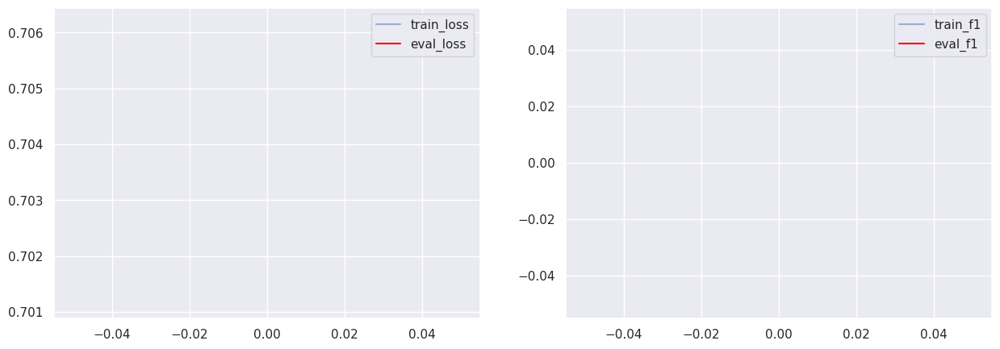

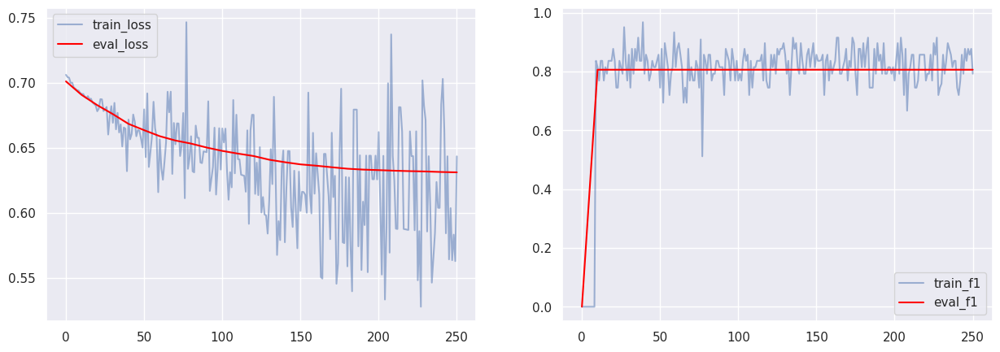

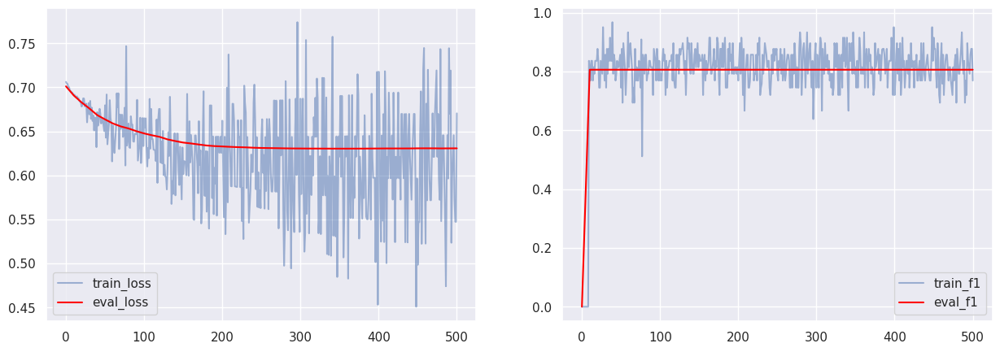

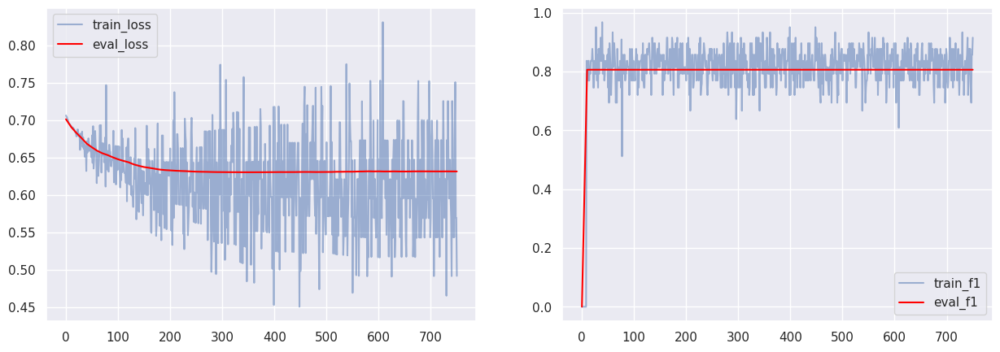

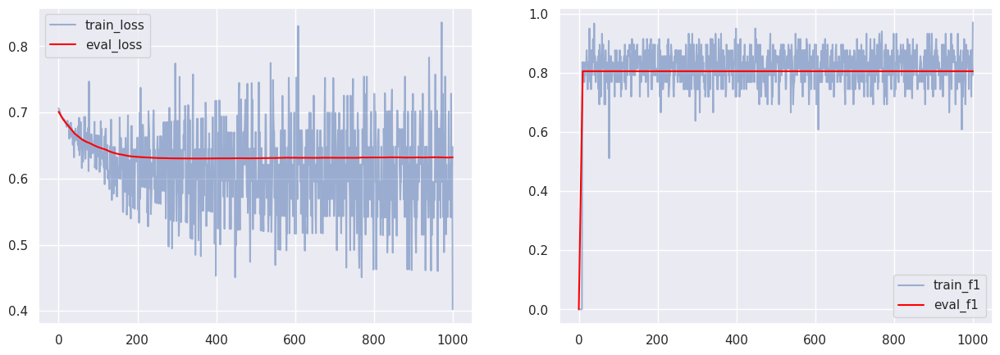

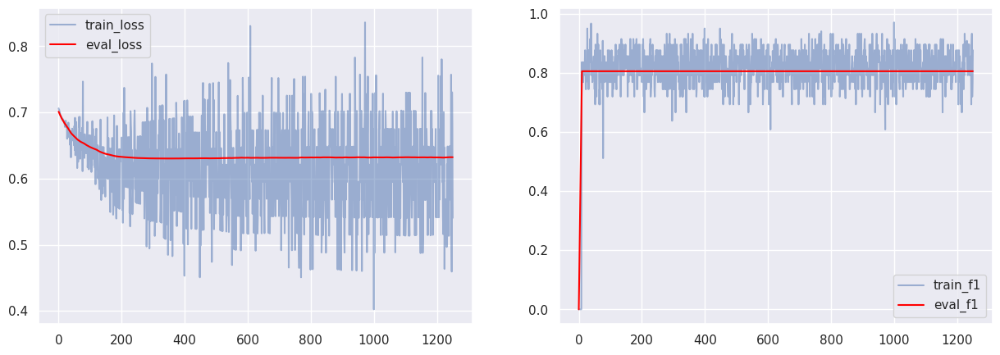

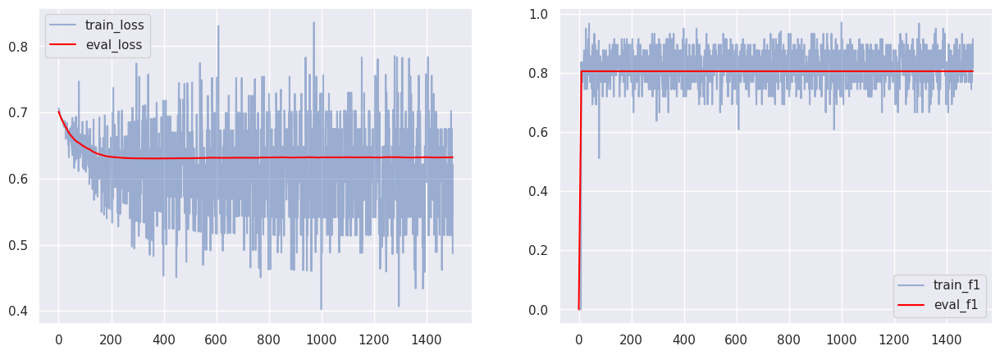

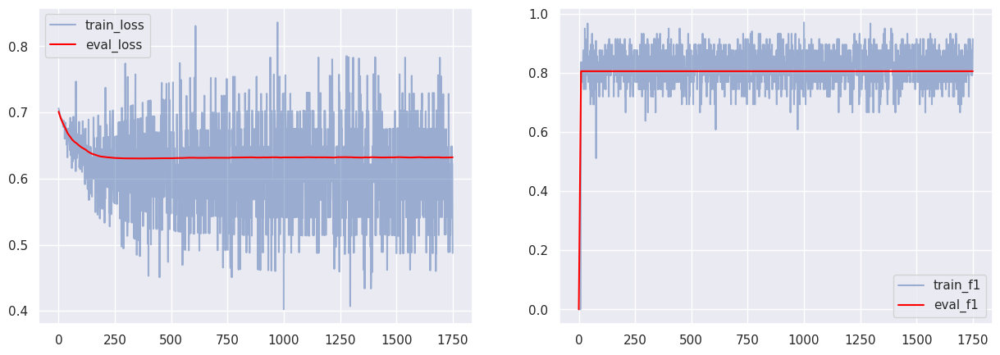

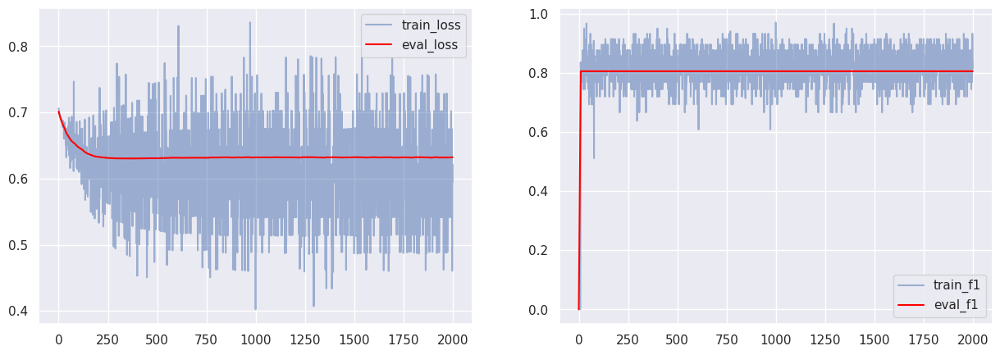

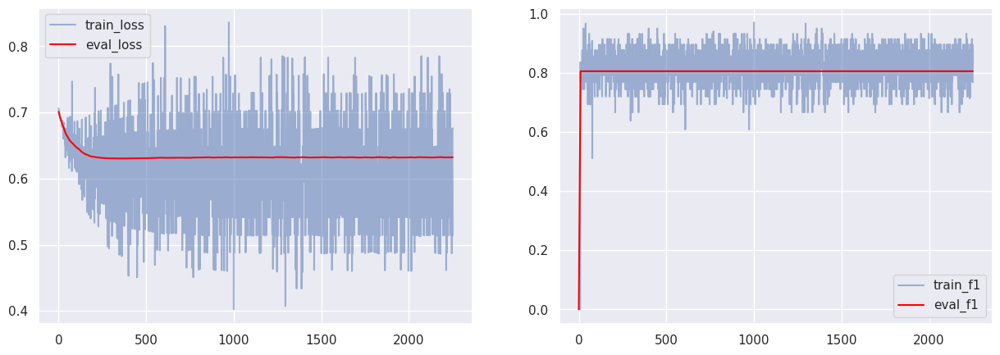

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): Sigmoid()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): Sigmoid()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): Sigmoid()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

In [21]:
train(model, num_epoch = 30)

In [22]:
eval(model, dataloder_test)

(0.5994016394615174, 0.8326848249027238)

**На графиках видно, что модель достигла плато, использую SGD with momentum, а также изменю lr**

In [30]:
optimizer = SGD(model.parameters(), momentum = 0.009, lr = 0.001)

In [31]:
model = AirMLP(9, 6, 1)
model.to(device)

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): Sigmoid()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): Sigmoid()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): Sigmoid()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

  0%|          | 0/30 [00:00<?, ?it/s]

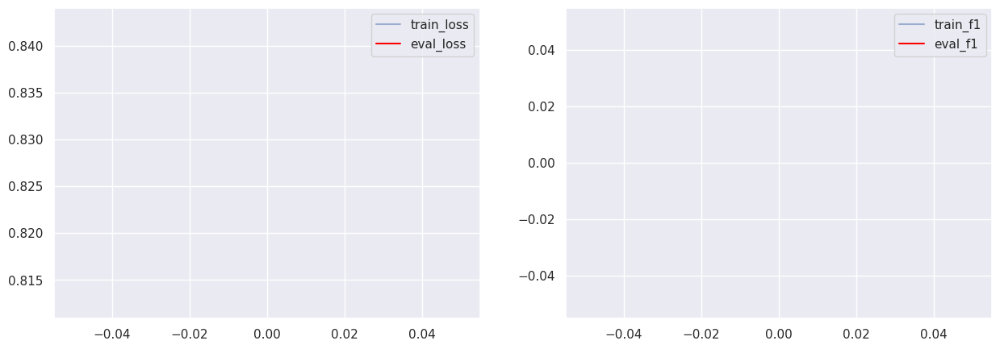

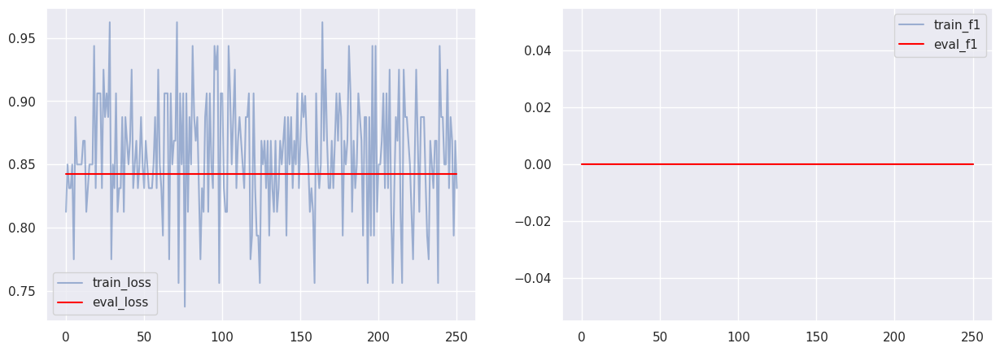

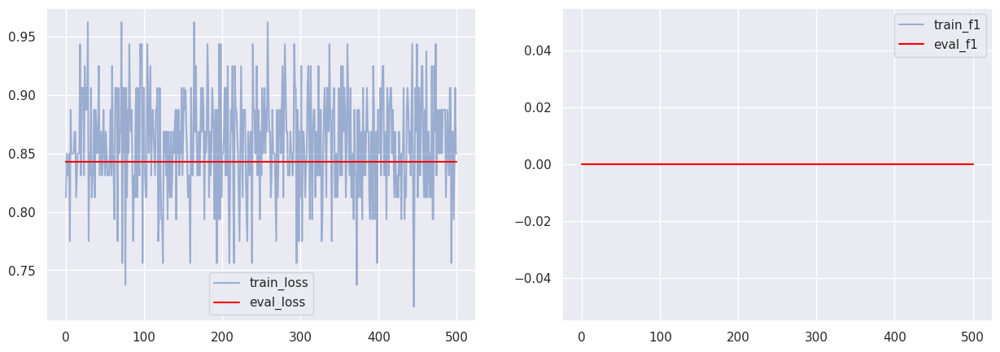

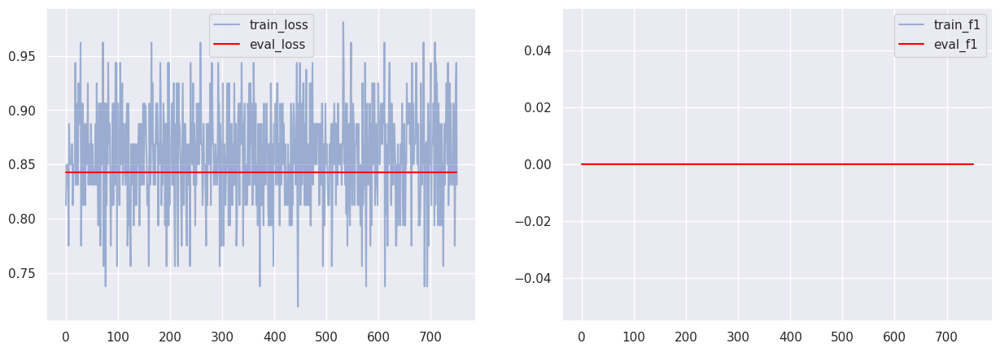

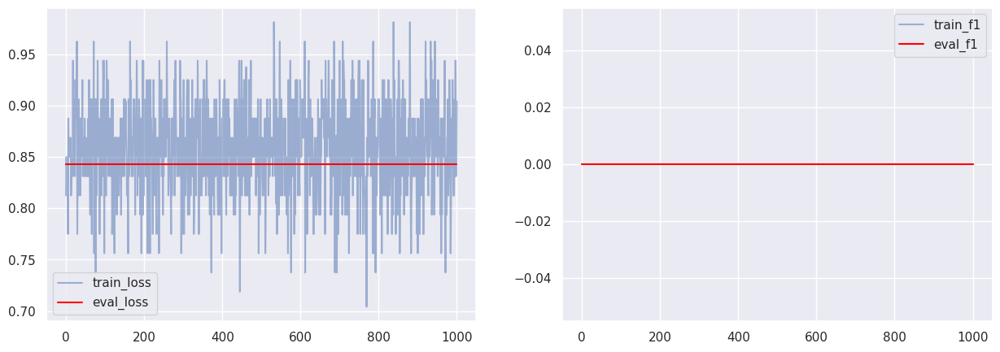

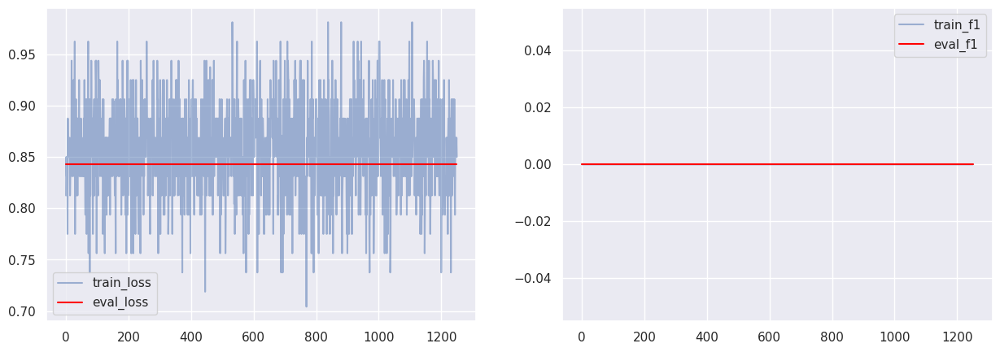

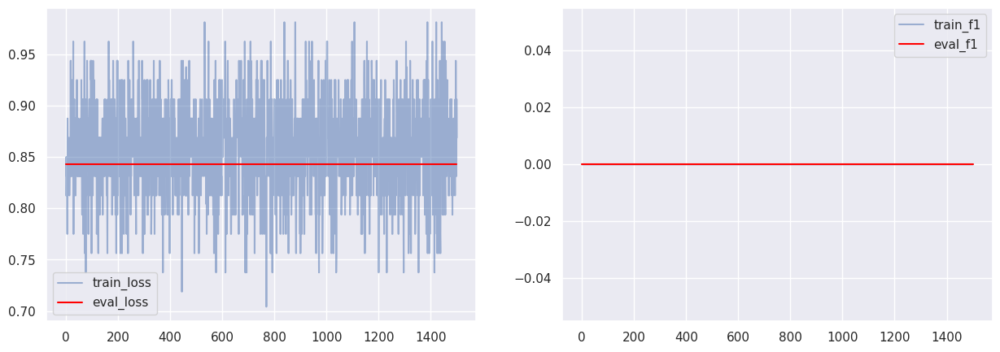

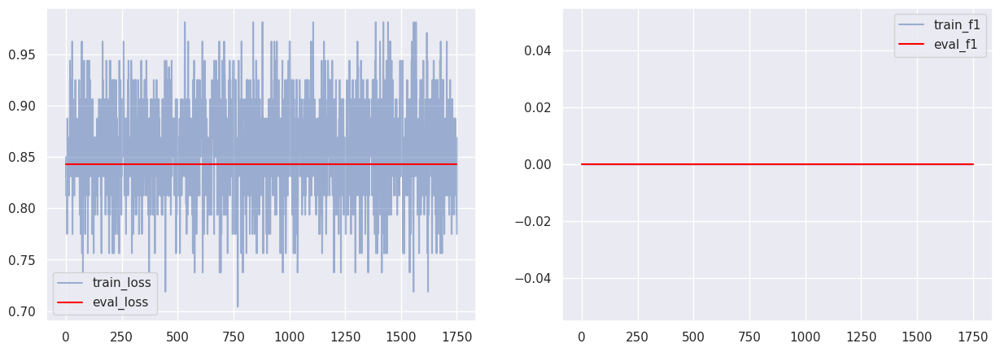

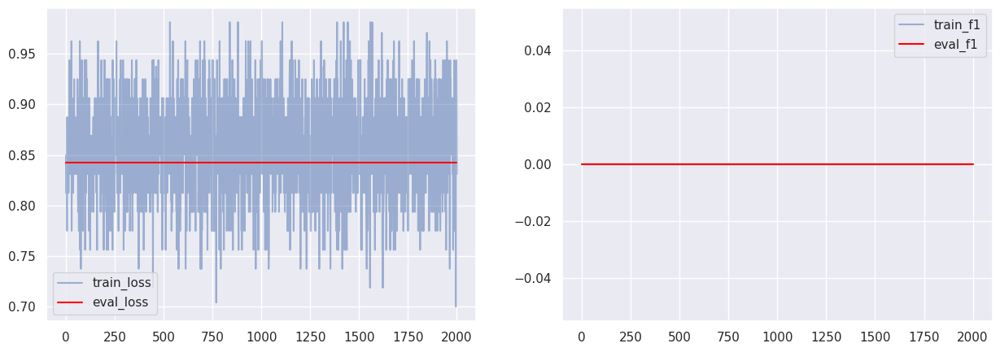

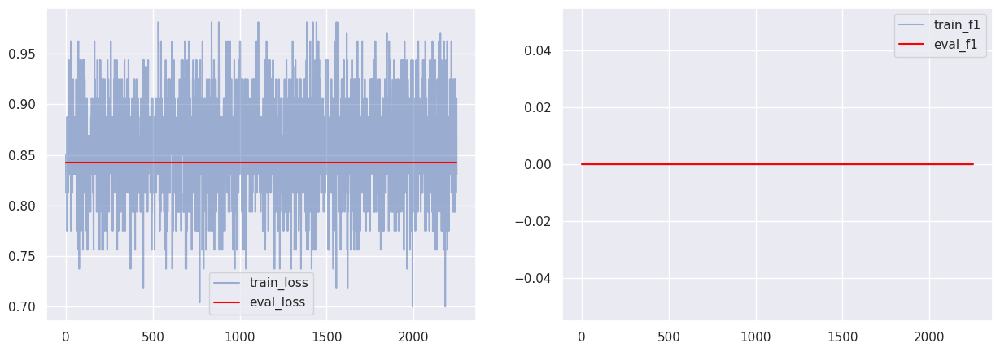

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): Sigmoid()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): Sigmoid()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): Sigmoid()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

In [32]:
train(model, num_epoch=30)

In [33]:
eval(model, dataloder_test)

(0.8653973911603292, 0.0)

**При использовании другого оптимизатора, модель также не достигла лучших результатов, поэтому применю другую функцию активации, также возможно при использовании оптимизатора с моментумом, встретился с затуханием градиентов**

In [34]:
model = AirMLP(9, 6, 1, activation = Tanh)
model.to(device)

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): Tanh()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): Tanh()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): Tanh()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): Tanh()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

In [35]:
optimizer = SGD(model.parameters(), lr = 0.001)

  0%|          | 0/30 [00:00<?, ?it/s]

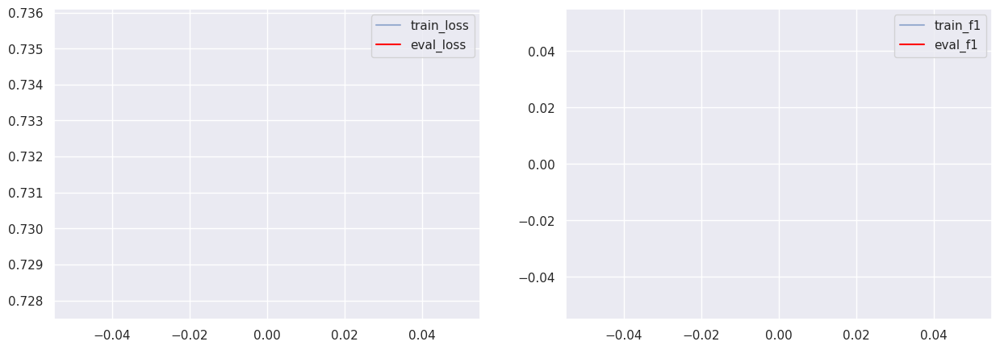

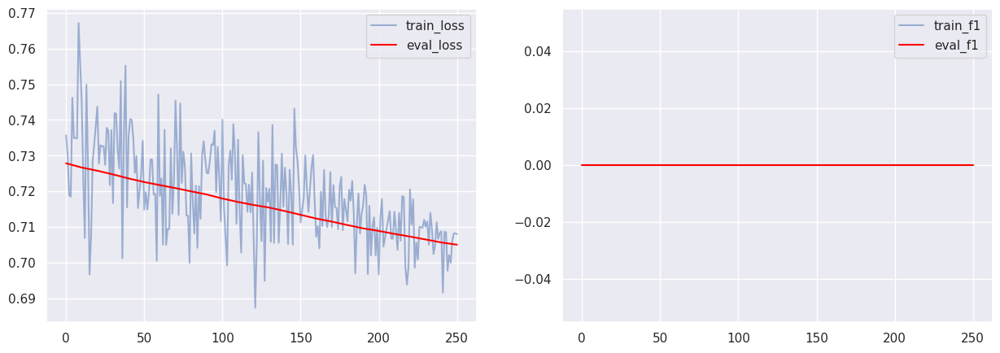

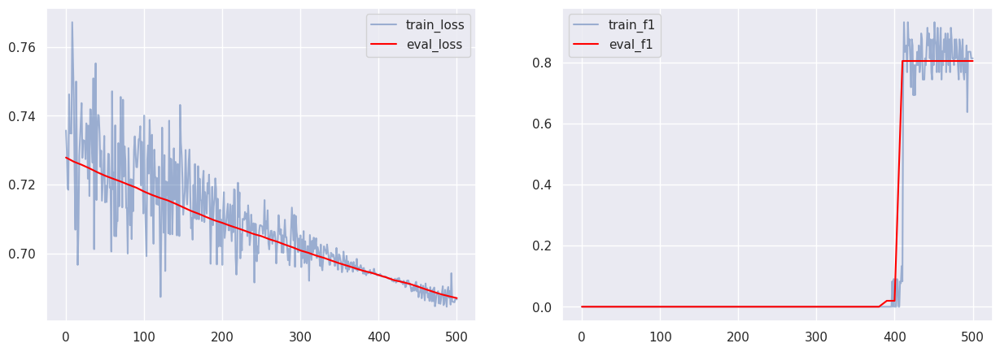

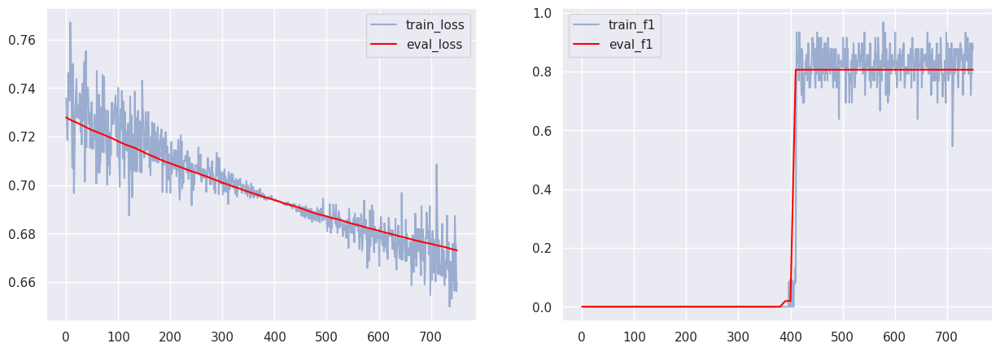

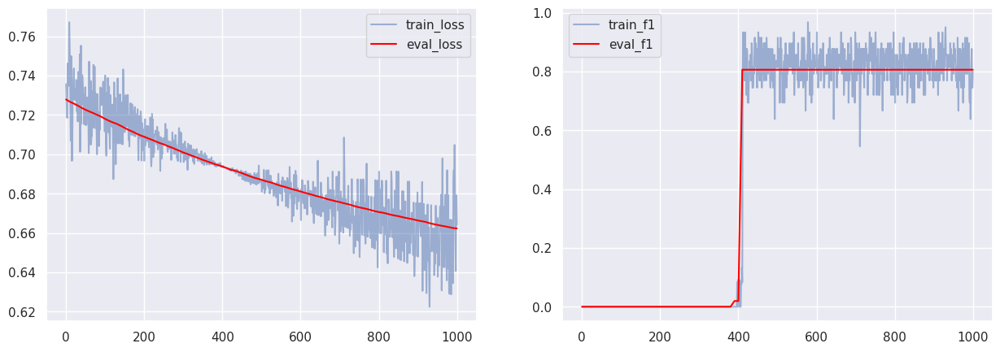

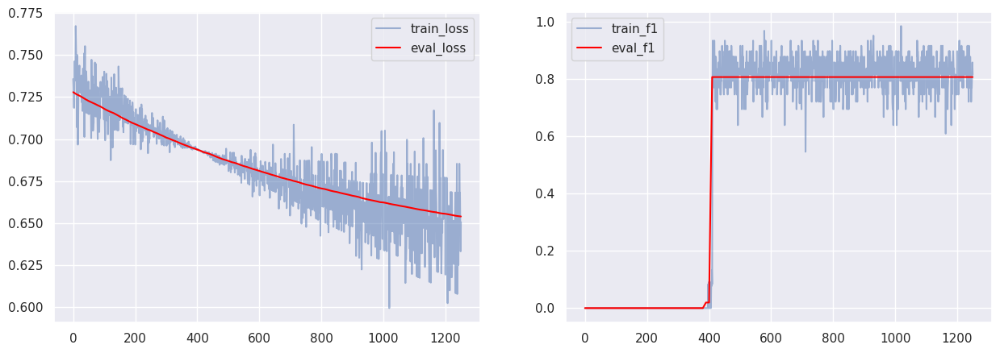

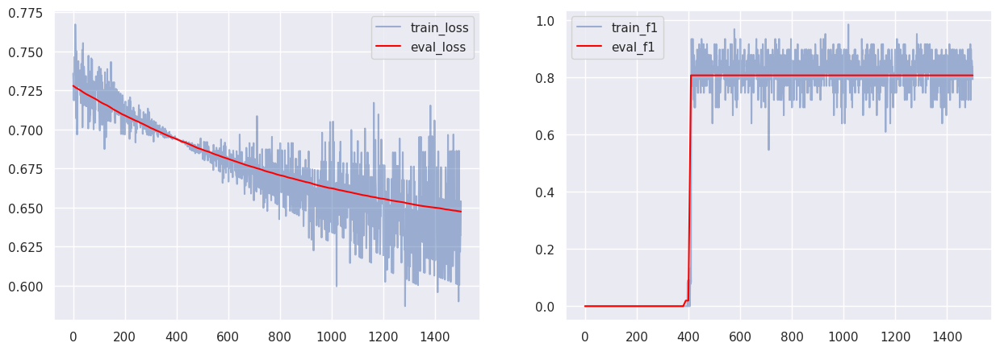

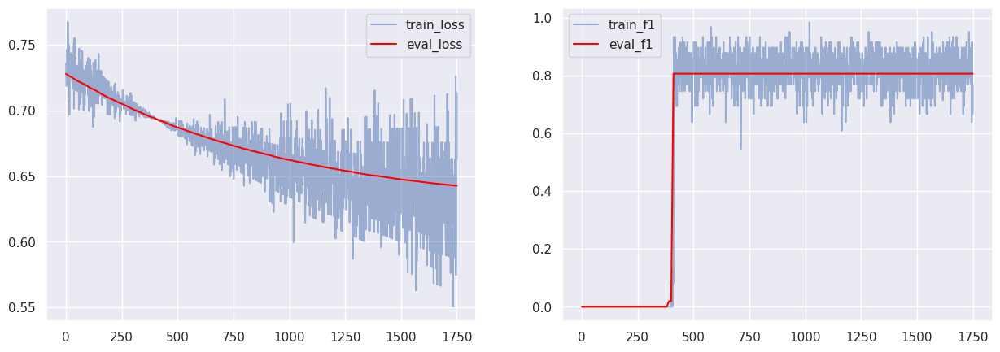

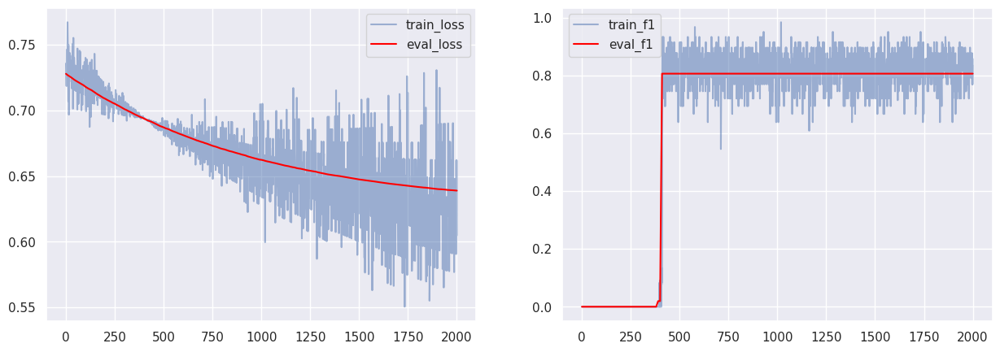

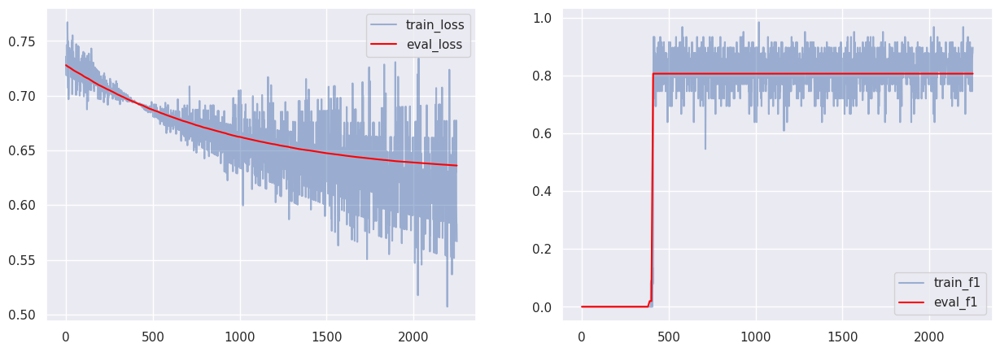

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): Tanh()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): Tanh()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): Tanh()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): Tanh()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

In [37]:
train(model, num_epoch=30)

In [38]:
eval(model, dataloder_test)

(0.6160169607798258, 0.8326848249027238)

**При изменении функции активации модель начала лучше обучаться, также на это повлиял lr**

**Попробую обучить с функцией активации ReLU**

In [39]:
model = AirMLP(9, 6, 1, activation = ReLU)
model.to(device)

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): ReLU()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): ReLU()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): ReLU()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): ReLU()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

In [40]:
optimizer = SGD(model.parameters(), lr = 0.001)

  0%|          | 0/30 [00:00<?, ?it/s]

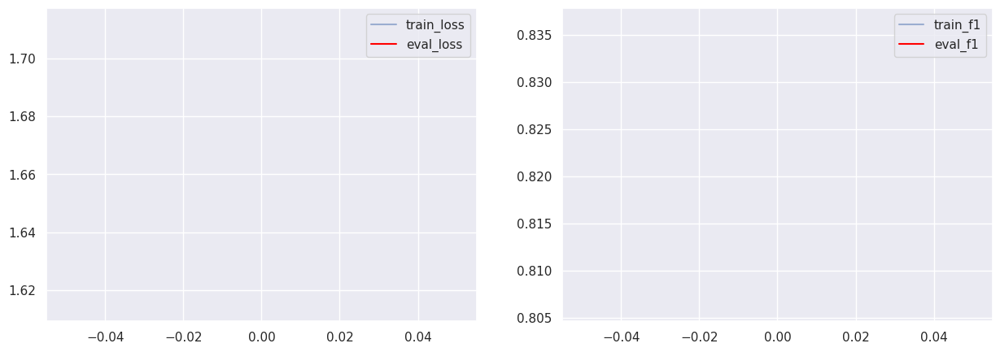

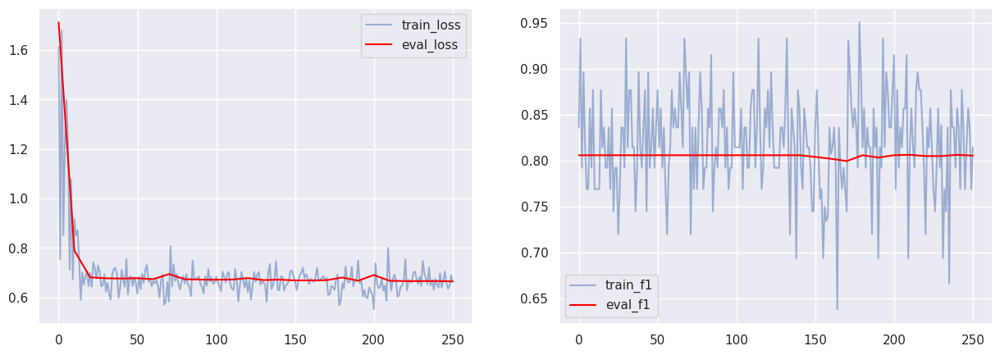

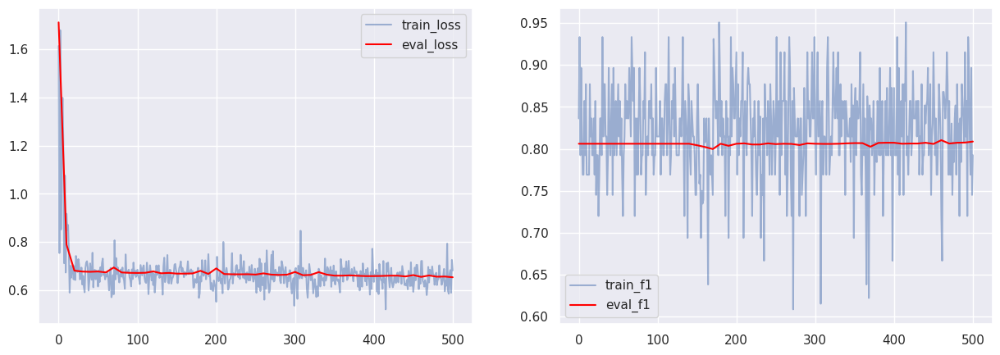

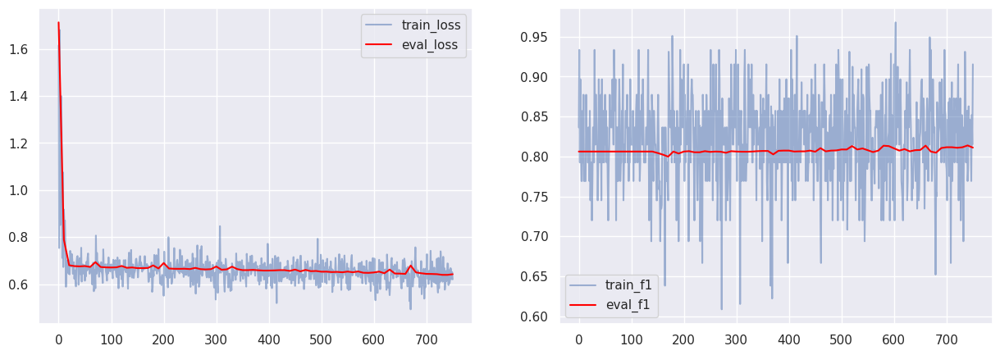

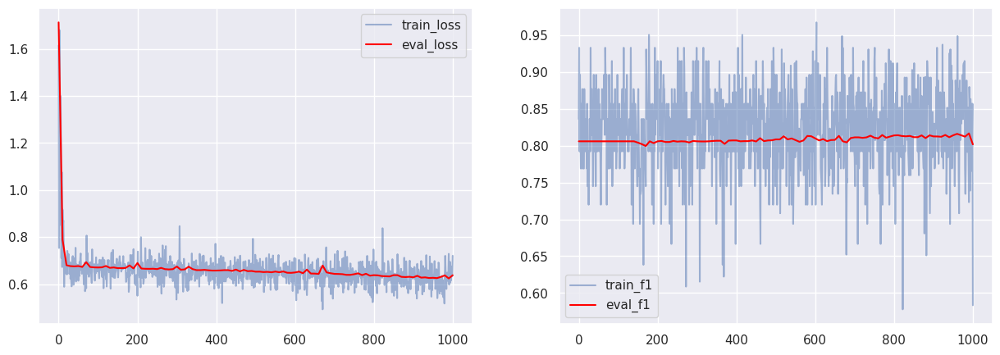

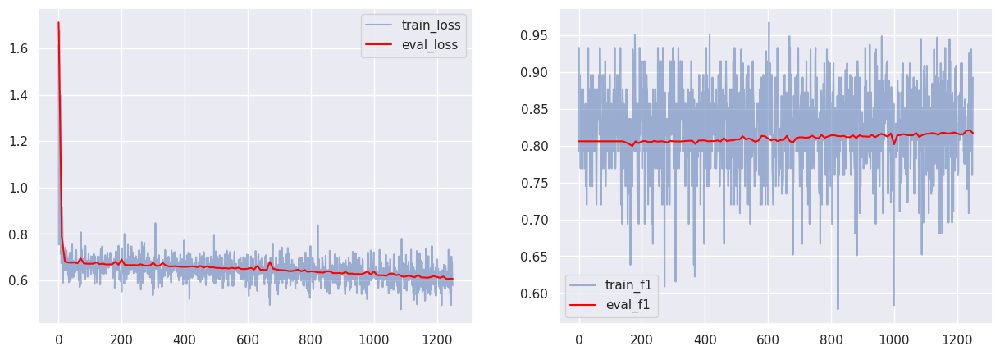

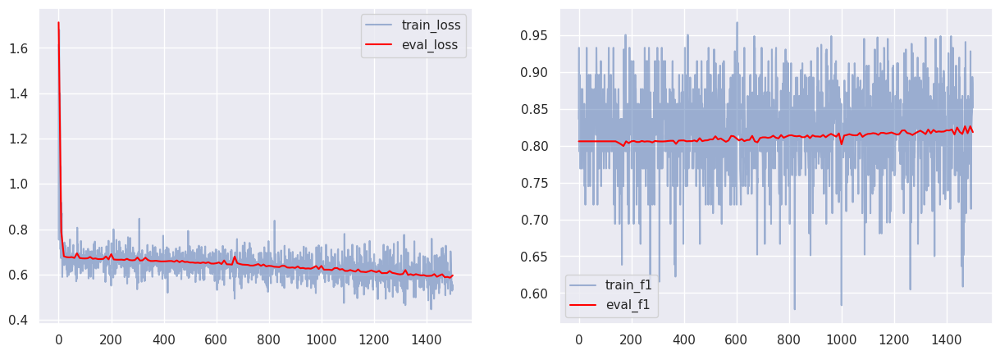

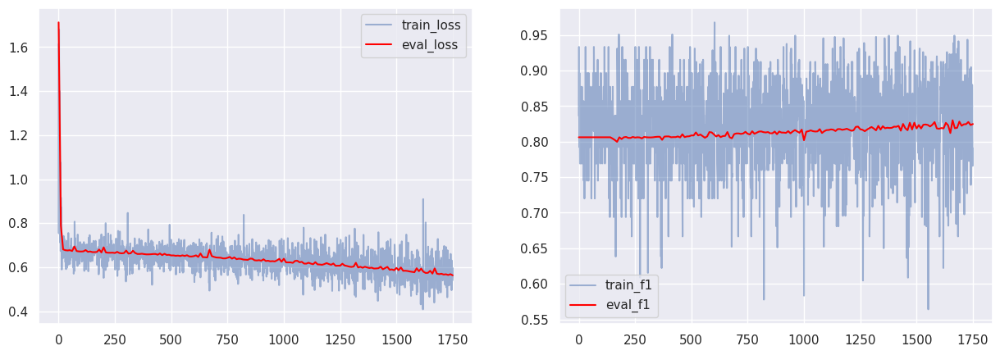

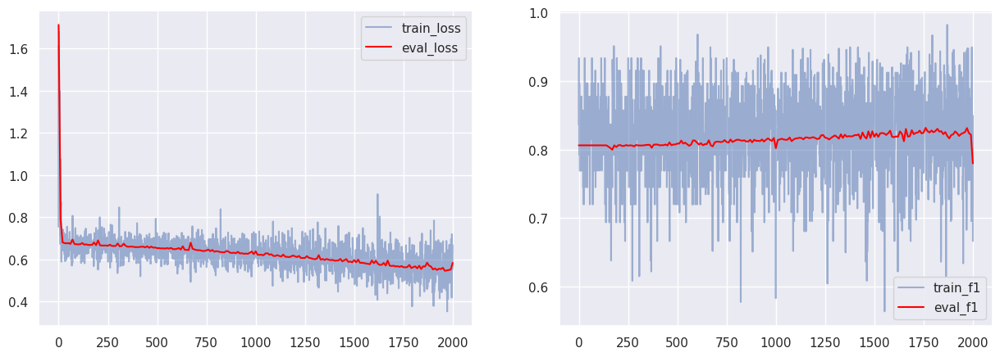

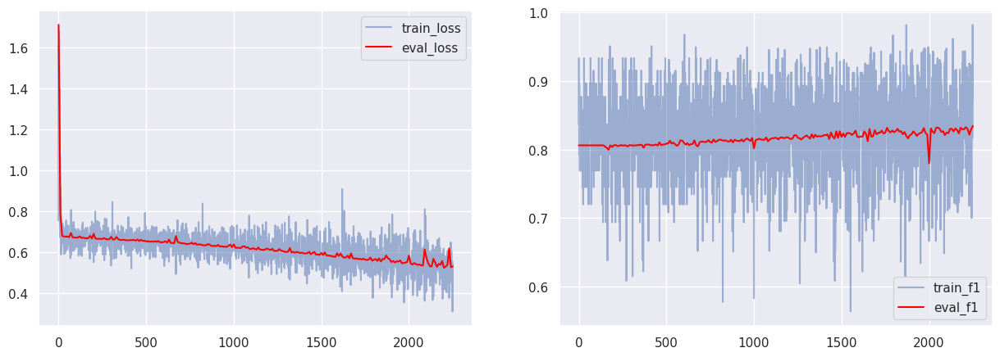

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): ReLU()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): ReLU()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): ReLU()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): ReLU()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

In [41]:
train(model, num_epoch=30)

In [42]:
eval(model, dataloder_test)

(0.5154706941445668, 0.8450582649978421)

**При использовании ReLU получил наилучшие результаты также можно заметить что модель может учиться дальше 30 эпох, поскольку видна тенденция на рост метрики на валиадационной выборке**

In [43]:
model = AirMLP(9, 6, 1, activation = ReLU)
model.to(device)

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): ReLU()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): ReLU()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): ReLU()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): ReLU()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

**Применю моментум для оптимизации**

In [44]:
optimizer = SGD(model.parameters(), lr = 0.001, momentum = 0.009)

  0%|          | 0/100 [00:00<?, ?it/s]

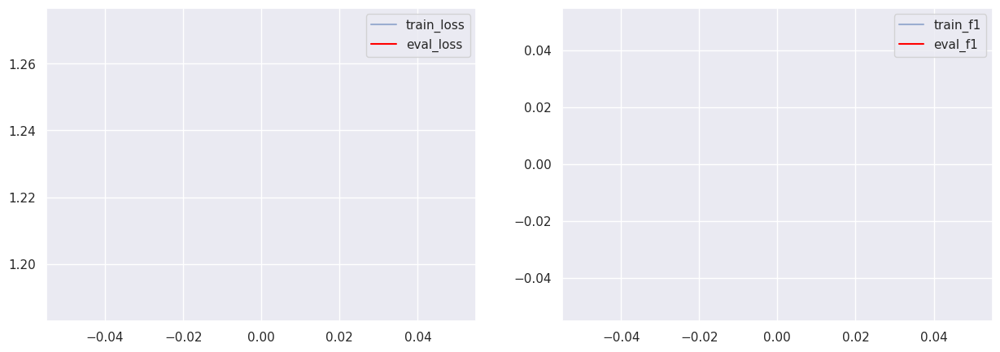

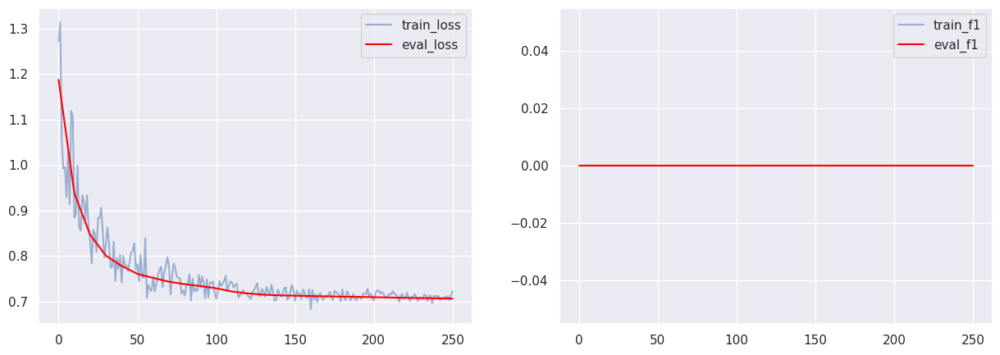

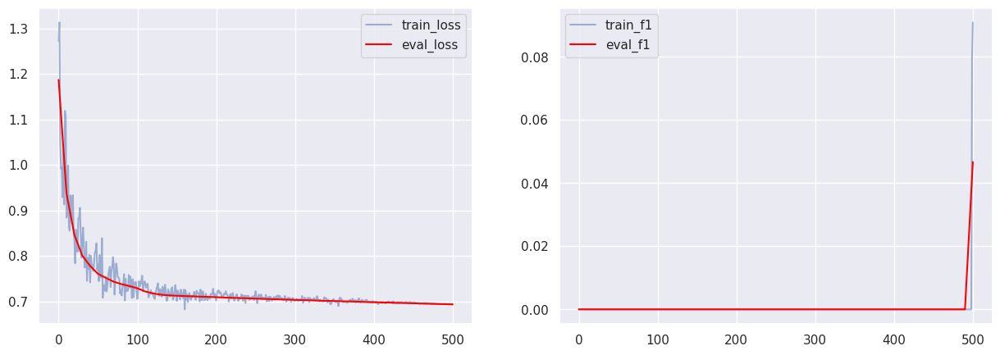

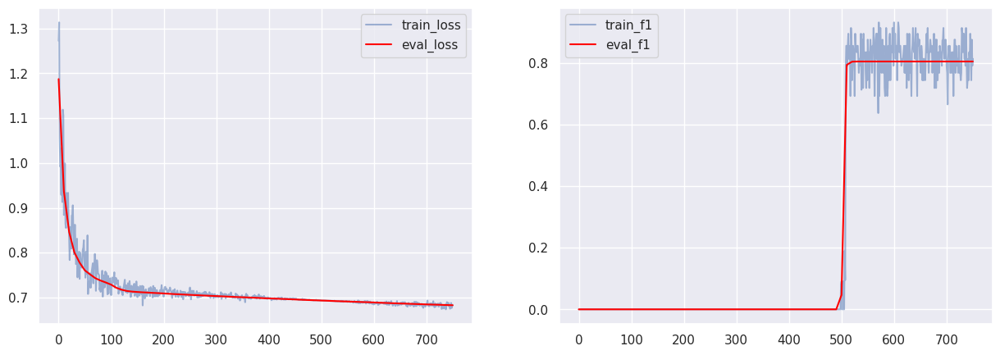

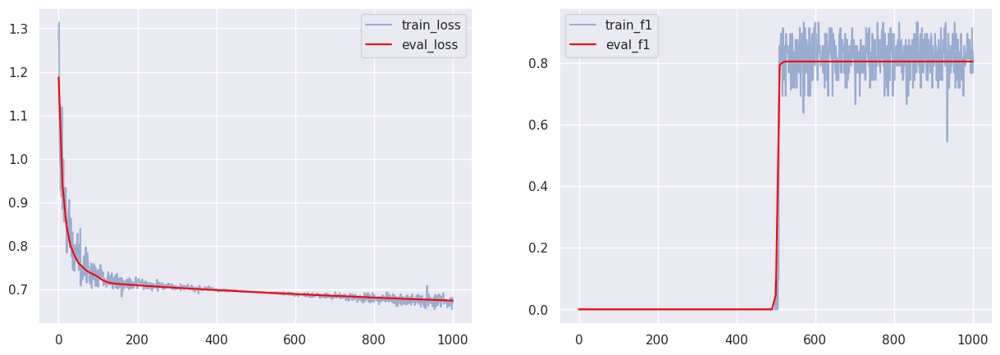

...

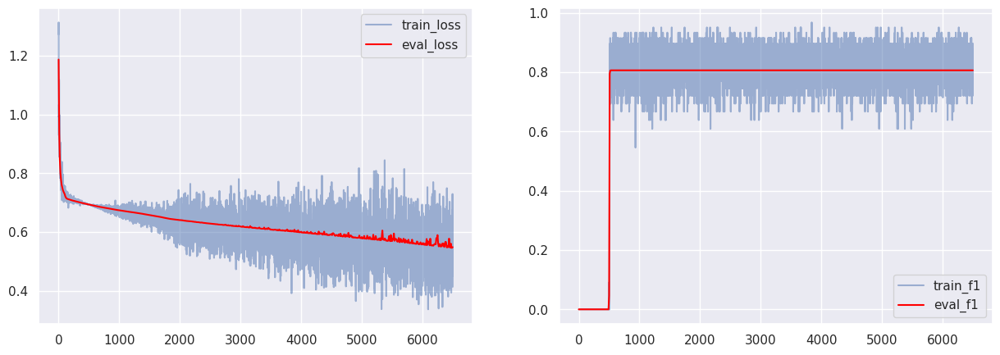

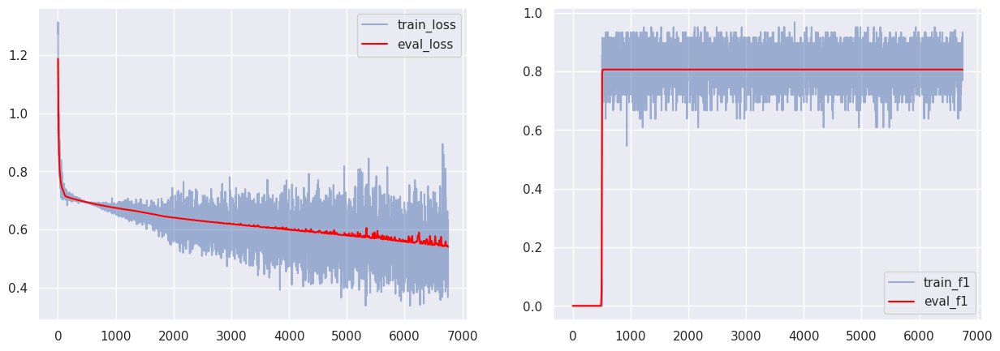

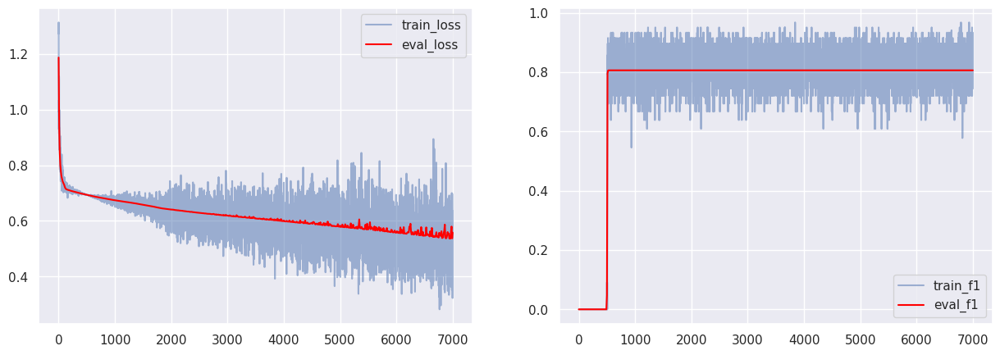

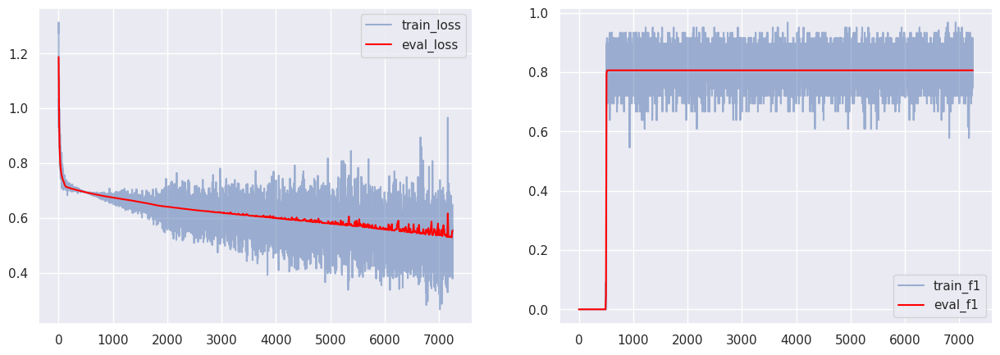

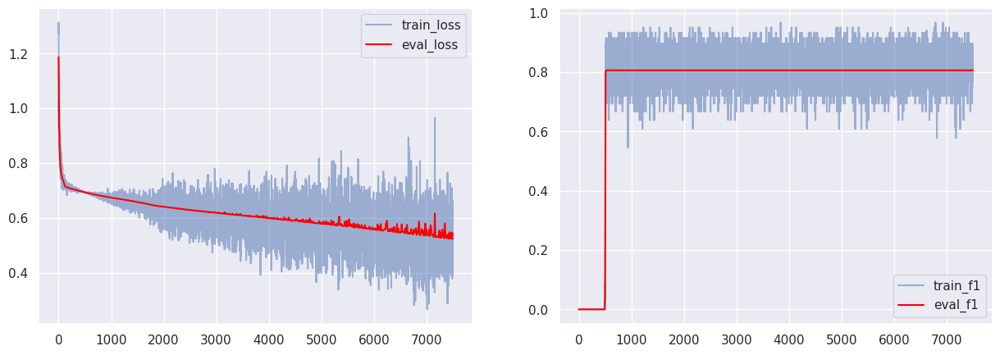

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): ReLU()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): ReLU()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): ReLU()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): ReLU()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

In [45]:
train(model, num_epoch=100)

In [46]:
eval(model, dataloder_test)

(0.5048202786445618, 0.8326848249027238)

**Использование Adam**

In [47]:
model = AirMLP(9, 6, 1, activation = ReLU)
model.to(device)

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): ReLU()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): ReLU()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): ReLU()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): ReLU()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

In [48]:
optimizer = Adam(model.parameters(), lr= 0.001)

  0%|          | 0/150 [00:00<?, ?it/s]

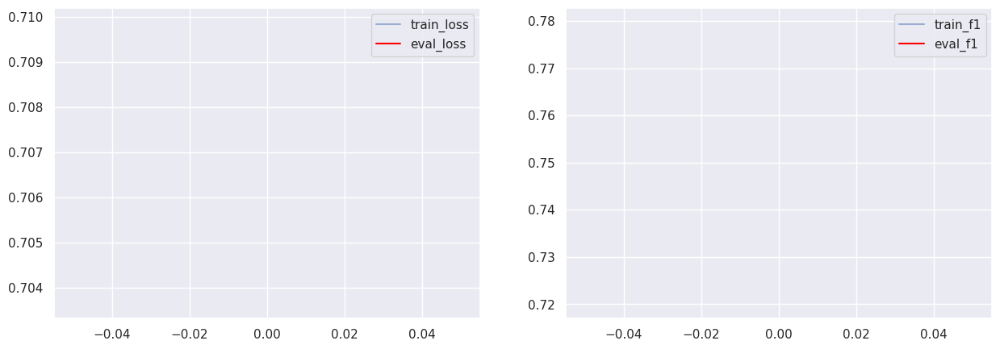

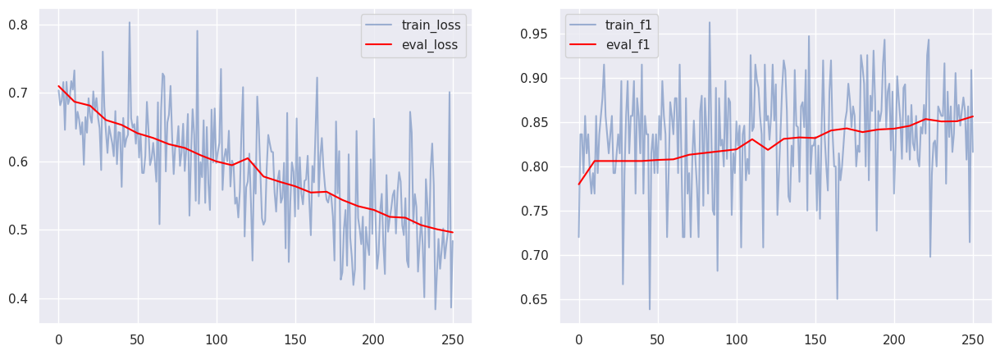

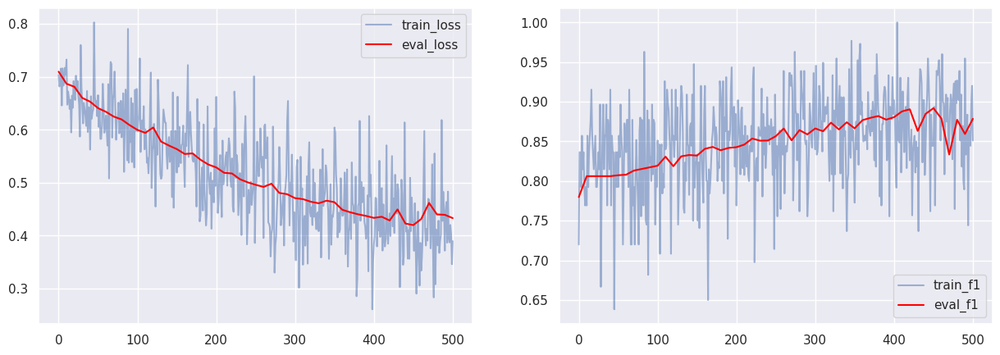

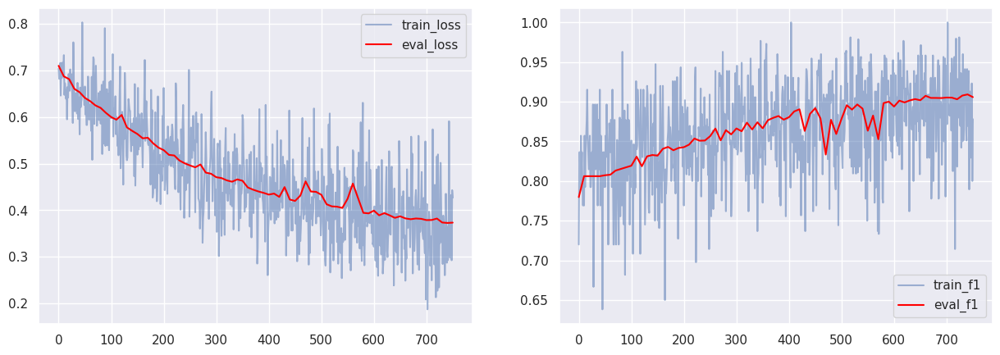

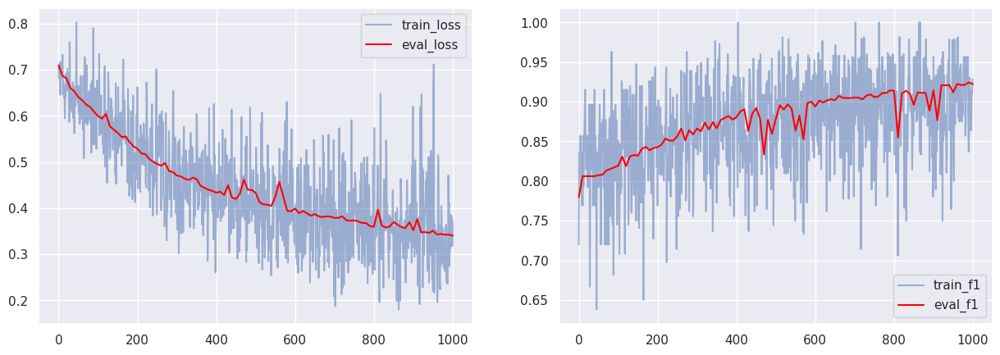

...

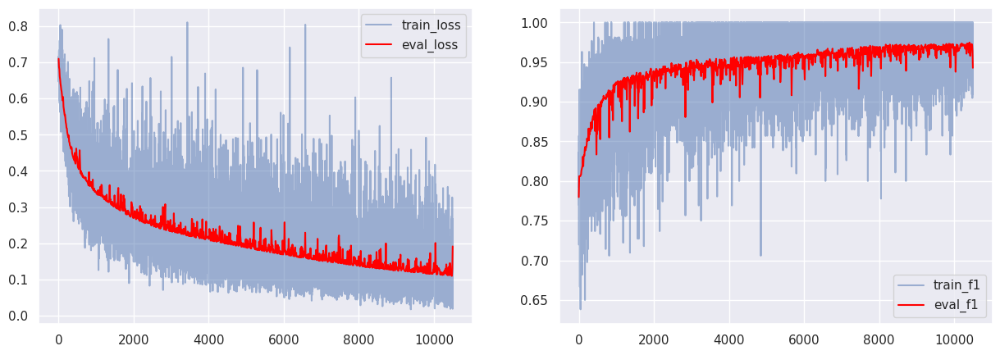

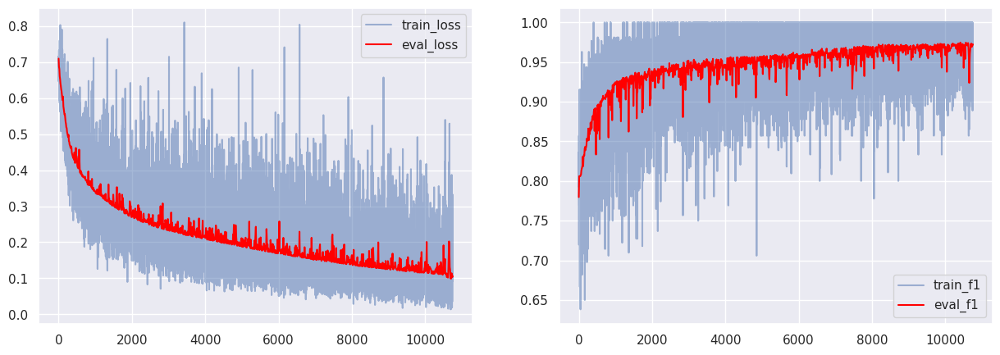

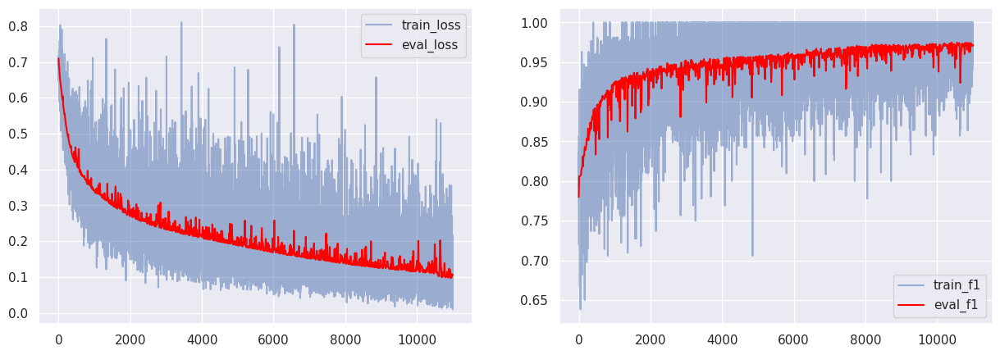

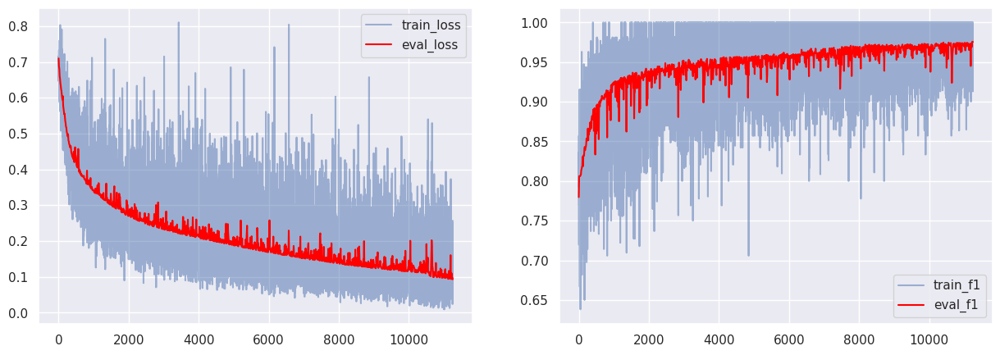

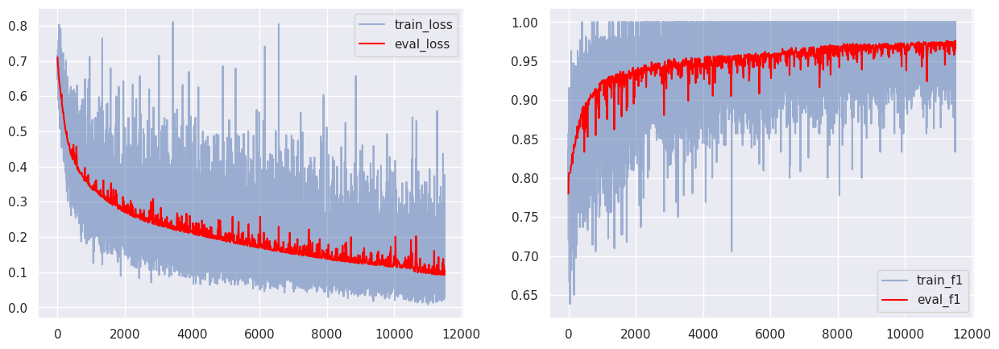

AirMLP(
  (layers): Sequential(
    (0): Linear(in_features=9, out_features=6, bias=True)
    (1): ReLU()
    (2): Linear(in_features=6, out_features=6, bias=True)
    (3): ReLU()
    (4): Linear(in_features=6, out_features=6, bias=True)
    (5): ReLU()
    (6): Linear(in_features=6, out_features=6, bias=True)
    (7): ReLU()
    (8): Linear(in_features=6, out_features=1, bias=True)
  )
)

In [49]:
train(model, num_epoch=150)

In [50]:
eval(model, dataloder_test)

(0.10258041970431804, 0.9708920187793427)

In [67]:
all_preds = []
all_labels = []

model.eval()

with torch.no_grad():
  for x, targets in dataloder_test:
    x, targets = x.to(device), targets.to(device)
    preds = model(x)
    preds = (preds > 0.5)

    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(targets.cpu().numpy())

report = classification_report(all_labels, all_preds)
report

'              precision    recall  f1-score   support\n\n         0.0       0.92      0.94      0.93       430\n         1.0       0.98      0.97      0.97      1070\n\n    accuracy                           0.96      1500\n   macro avg       0.95      0.95      0.95      1500\nweighted avg       0.96      0.96      0.96      1500\n'